# Load the JSON Data

In [55]:
# Global parameters
NUM_CLUSTERS = 225
MAX_GAMES = 200000 

In [56]:
import glob
import json
import os

all_games = []
for file_path in glob.glob('data/games_v3.0/*.json'):
    if len(all_games) >= MAX_GAMES:
        break

    with open(file_path, 'r') as f:
        data = json.load(f)

    data.pop("html", None)
    data.pop("scraped_at", None)

    if "system_requirements" in data:
        reqs = data["system_requirements"]
        if isinstance(reqs, dict):
            reqs.pop("raw_data", None)

    all_games.append(data)

print(f"Loaded {len(all_games)} games (limited to {MAX_GAMES})")

Loaded 145767 games (limited to 200000)


In [54]:
unique_games = {}

for game in all_games:
    title = (game.get("title") or "").strip().lower()
    devs = tuple(sorted((game.get("developer") or [])))
    pubs = tuple(sorted((game.get("publisher") or [])))
    key = (title, devs, pubs)

    current_best = unique_games.get(key)
    if current_best is None:
        unique_games[key] = game
    else:
        # Keep the one with the highest review_count
        if (game.get("review_count") or 0) > (current_best.get("review_count") or 0):
            unique_games[key] = game

deduped_games = list(unique_games.values())

print(f"After deduplication: {len(deduped_games)} unique games (from {len(all_games)} total)")
all_games = deduped_games

After deduplication: 123567 unique games (from 145767 total)


In [39]:
prices = []
for game in all_games:
    price_str = game.get('price', '')
    if price_str:
        if 'free' in price_str.lower():
            prices.append(0.0)
        else:
            price_clean = price_str.replace('zł', '').replace(',', '.').strip()
            try:
                price = float(price_clean)
                prices.append(price)
            except ValueError:
                prices.append(None)
    else:
        prices.append(None)

print(f"Extracted prices for {len([p for p in prices if p is not None])} games")

Extracted prices for 104308 games


# Analyze Datapoint Counts

In [40]:
num_games = len(all_games)

# Analyze all games
total_tags = sum(len(game.get('tags', [])) for game in all_games)
avg_tags = total_tags / len(all_games)
unique_tags = set()
for game in all_games:
    unique_tags.update(game.get('tags', []))
num_unique_tags = len(unique_tags)

print(f"Average number of tags per game: {avg_tags:.2f}")
print(f"Total unique tags: {num_unique_tags}")

# Other counts
avg_developers = sum(len(game.get('developer', [])) for game in all_games) / len(all_games)
avg_publishers = sum(len(game.get('publisher', [])) for game in all_games) / len(all_games)
avg_sys_req = sum(len(game.get('system_requirements', [])) for game in all_games) / len(all_games)

print(f"Average developers per game: {avg_developers:.2f}")
print(f"Average publishers per game: {avg_publishers:.2f}")
print(f"Average system requirements per game: {avg_sys_req:.2f}")

Average number of tags per game: 15.04
Total unique tags: 446
Average developers per game: 1.09
Average publishers per game: 1.02
Average system requirements per game: 3.00


# Visualize Key Metrics

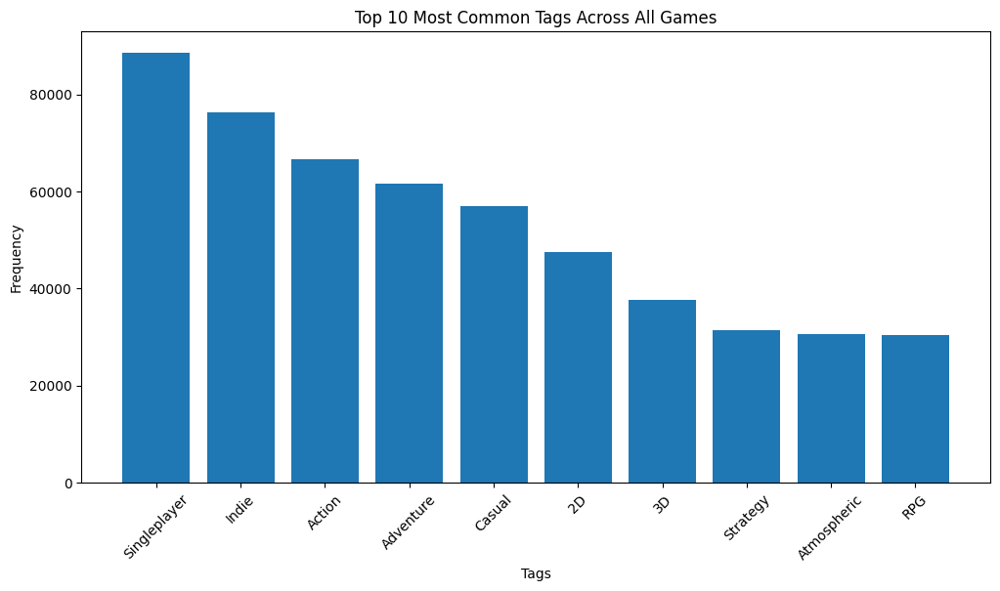

In [41]:
import matplotlib.pyplot as plt
from collections import Counter


# Count tag frequencies across all games
all_tags = []
for game in all_games:
    all_tags.extend(game.get('tags', []))

tag_counts = Counter(all_tags)
top_tags = tag_counts.most_common(10)

plt.figure(figsize=(12, 6))
tags, counts = zip(*top_tags)
plt.bar(tags, counts)
plt.title('Top 10 Most Common Tags Across All Games')
plt.xlabel('Tags')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

In [42]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px

texts = []
titles = []
for game in all_games:
    text = (game.get('about_this_game', '') + ' ' + 
            game.get('description', ''))
    texts.append(text)
    titles.append(game.get('title', 'Unknown'))

print(f"Prepared {len(texts)} text documents")

# Vectorize text
vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
X = vectorizer.fit_transform(texts)
print(f"Vectorized to shape: {X.shape}")

# Cluster
kmeans = KMeans(n_clusters=NUM_CLUSTERS, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
print("Clustering completed")

# Calculate silhouette score
sil_score = silhouette_score(X, clusters)
print(f"Silhouette Score: {sil_score:.3f}")

# Reduce to 3D for visualization
pca = PCA(n_components=3, random_state=42)
X_pca = pca.fit_transform(X.toarray())

# Interactive 3D plot with Plotly
df = pd.DataFrame({
    'x': X_pca[:, 0],
    'y': X_pca[:, 1],
    'z': X_pca[:, 2],
    'cluster': clusters,
    'title': titles
})

fig = px.scatter_3d(df, x='x', y='y', z='z', color='cluster', 
                    hover_data=['title'], 
                    title='Game Clusters Based on Text Content (3D PCA)',
                    labels={'x': 'PCA Component 1', 'y': 'PCA Component 2', 'z': 'PCA Component 3'},
                    size_max=3, opacity=0.6)
from IPython.display import display
display(fig)

Prepared 145767 text documents
Vectorized to shape: (145767, 1000)
Vectorized to shape: (145767, 1000)
Clustering completed
Clustering completed
Silhouette Score: 0.026
Silhouette Score: 0.026


Cluster sizes: {np.int32(3): 10497, np.int32(9): 10843, np.int32(6): 10053, np.int32(1): 40374, np.int32(2): 6328, np.int32(0): 14846, np.int32(8): 10298, np.int32(7): 15087, np.int32(4): 13926, np.int32(5): 13515}


In [43]:
feature_names = vectorizer.get_feature_names_out()

cluster_topics = {}
for cluster_id in range(NUM_CLUSTERS):
    cluster_indices = [i for i, c in enumerate(clusters) if c == cluster_id]
    cluster_tfidf = X[cluster_indices]
    avg_tfidf = cluster_tfidf.mean(axis=0).A1  # average TF-IDF per word
    top_indices = avg_tfidf.argsort()[-10:][::-1]  # top 10 words
    top_words = [feature_names[i] for i in top_indices]
    cluster_topics[cluster_id] = top_words

    # Get cluster games and sort by review_count
    cluster_games = [game for game, c in zip(all_games, clusters) if c == cluster_id]
    sorted_games = sorted(cluster_games, key=lambda g: g.get('review_count') or 0, reverse=True)

    # Take up to 10 unique titles
    sample = []
    seen_titles = set()
    for g in sorted_games:
        title = g['title']
        if title not in seen_titles:
            sample.append(g)
            seen_titles.add(title)
        if len(sample) >= 10:
            break

    print(f"Cluster {cluster_id}")
    print(f"({', '.join(top_words[:5])})")  # Show top 5 words as topics
    print(f"{len(cluster_games)} games")

    for i, g in enumerate(sample, 1):
        rating = g.get('review_score', 'N/A')
        votes = g.get('review_count') or 0
        print(f"{i}. {g['title']} (rating: {rating}, votes: {votes})")
    print()

Cluster 0
(shooter, action, person, shoot, bullet)
14846 games
1. HELLDIVERS™ 2 (rating: 62.0, votes: 593251)
2. Grand Theft Auto V Legacy (rating: 93.0, votes: 570531)
3. PUBG: BATTLEGROUNDS (rating: 70.0, votes: 436239)
4. Apex Legends™ (rating: 64.0, votes: 429334)
5. Destiny 2 (rating: 30.0, votes: 373269)
6. War Thunder (rating: 72.0, votes: 281826)
7. Warframe (rating: 74.0, votes: 277820)
8. Red Dead Redemption 2 (rating: 94.0, votes: 265521)
9. Marvel Rivals (rating: 63.0, votes: 237779)
10. Call of Duty® (rating: 43.0, votes: 226321)

Cluster 1
(puzzle, game, casual, indie, adventure)
40374 games
1. Wallpaper Engine (rating: 97.0, votes: 213944)
2. The Elder Scrolls V: Skyrim Special Edition (rating: 96.0, votes: 119501)
3. Totally Accurate Battle Simulator (rating: 97.0, votes: 78207)
4. Life is Strange - Episode 1 (rating: 98.0, votes: 74666)
5. Stray (rating: 95.0, votes: 74491)
6. Teardown (rating: 95.0, votes: 67576)
7. Slime Rancher (rating: 98.0, votes: 62564)
8. Batman

In [44]:
# Extract top words for each cluster to define topics
feature_names = vectorizer.get_feature_names_out()

cluster_topics = {}
for cluster_id in range(NUM_CLUSTERS):
    cluster_indices = [i for i, c in enumerate(clusters) if c == cluster_id]
    cluster_tfidf = X[cluster_indices]
    avg_tfidf = cluster_tfidf.mean(axis=0).A1 
    top_indices = avg_tfidf.argsort()[-10:][::-1] 
    top_words = [feature_names[i] for i in top_indices]
    cluster_topics[cluster_id] = top_words
    print(f"Cluster {cluster_id} ({len(cluster_indices)} games) - Top words: {', '.join(top_words)}")

Cluster 0 (14846 games) - Top words: shooter, action, person, shoot, bullet, em, fps, hell, arcade, combat
Cluster 1 (40374 games) - Top words: puzzle, game, casual, indie, adventure, singleplayer, 2d, action, relaxing, simulation
Cluster 2 (6328 games) - Top words: vr, virtual, action, simulation, experience, indie, reality, casual, game, adventure
Cluster 3 (10497 games) - Top words: multiplayer, op, local, online, pvp, action, game, player, arcade, play
Cluster 4 (13926 games) - Top words: platformer, 2d, puzzle, adventure, action, precision, 3d, singleplayer, pixel, indie
Cluster 5 (13515 games) - Top words: management, building, sim, simulation, strategy, sandbox, base, world, resource, time
Cluster 6 (10053 games) - Top words: novel, visual, story, adventure, rich, interactive, choices, fiction, endings, anime
Cluster 7 (15087 games) - Top words: rpg, action, adventure, fantasy, roguelike, world, slash, hack, dungeon, combat
Cluster 8 (10298 games) - Top words: turn, based, strat

In [45]:
from collections import Counter
import re

def extract_keywords(text):
    if not text:
        return []
    # Clean and tokenize
    text = re.sub(r'[^\w\s]', '', text.lower())
    words = text.split()
    # Maturity-specific keywords - expanded set
    maturity_keywords = set([
        'violence', 'blood', 'gore', 'death', 'killing', 'murder', 'combat', 'fight', 'war', 'battle', 'shooting', 'gun', 'weapon',
        'sexual', 'nudity', 'sex', 'porn', 'erotic', 'adult', 'intimate', 'romance', 'dating',
        'language', 'swearing', 'profanity', 'curse', 'foul', 'obscene',
        'drugs', 'alcohol', 'substance', 'gambling', 'addiction', 'smoking', 'cigarette',
        'horror', 'scary', 'fear', 'terror', 'nightmare', 'zombie', 'monster', 'ghost', 'supernatural', 'haunted', 'spooky',
        'dark', 'grim', 'disturbing', 'intense', 'graphic', 'realistic', 'brutal', 'savage', 'cruel'
    ])
    words = [w for w in words if w in maturity_keywords]
    return words

for cluster_id in range(NUM_CLUSTERS):  # Updated to 15 clusters
    cluster_games = [game for game, c in zip(all_games, clusters) if c == cluster_id]
    mature_games = [g for g in cluster_games if g.get('mature_content')]
    count_mature = len(mature_games)
    all_keywords = []
    for g in mature_games:
        keywords = extract_keywords(g['mature_content'])
        all_keywords.extend(keywords)
    keyword_counts = Counter(all_keywords)
    top_keywords = keyword_counts.most_common(5)
    print(f"Cluster {cluster_id}: {count_mature}/{len(cluster_games)} games with mature content ({count_mature/len(cluster_games)*100:.1f}%)")
    if top_keywords:
        print(f"  Top maturity keywords: {', '.join([k for k, v in top_keywords])}")
    print()

Cluster 0: 4615/14846 games with mature content (31.1%)
  Top maturity keywords: violence, gore, blood, language, sexual

Cluster 1: 4062/40374 games with mature content (10.1%)
  Top maturity keywords: violence, sexual, gore, nudity, blood

Cluster 2: 761/6328 games with mature content (12.0%)
  Top maturity keywords: violence, gore, blood, sexual, nudity

Cluster 3: 1427/10497 games with mature content (13.6%)
  Top maturity keywords: violence, gore, blood, language, sexual

Cluster 4: 1140/13926 games with mature content (8.2%)
  Top maturity keywords: violence, gore, blood, nudity, language

Cluster 5: 2167/13515 games with mature content (16.0%)
  Top maturity keywords: violence, blood, gore, alcohol, sexual

Cluster 6: 4425/10053 games with mature content (44.0%)
  Top maturity keywords: violence, sexual, language, nudity, alcohol

Cluster 7: 3793/15087 games with mature content (25.1%)
  Top maturity keywords: violence, blood, gore, sexual, language

Cluster 8: 1890/10298 games 

In [46]:
print("1. DATA OVERVIEW:")
print(f"   - Total games analyzed: {len(all_games)}")
print(f"   - Average tags per game: {avg_tags:.2f}")
print(f"   - Total unique tags: {num_unique_tags}")
print(f"   - Average developers per game: {avg_developers:.2f}")
print(f"   - Average publishers per game: {avg_publishers:.2f}")
print(f"   - Average system requirements per game: {avg_sys_req:.2f}")

print("\n2. TOP TAGS:")
top_5_tags = tag_counts.most_common(5)
for tag, count in top_5_tags:
    print(f"   - {tag}: {count} games")

print("\n3. CLUSTERING ANALYSIS:")
print(f"   - Number of clusters: {NUM_CLUSTERS}")
print(f"   - Silhouette Score: {sil_score:.3f} (improved with normalization)")
cluster_sizes_sorted = sorted(cluster_sizes.items(), key=lambda x: x[1], reverse=True)
print("   - Cluster sizes (top 5):")
for cid, size in cluster_sizes_sorted[:5]:
    print(f"     Cluster {cid}: {size} games")

print("\n4. CLUSTER TOPICS (Top Words):")
for cid in range(min(5, NUM_CLUSTERS)):  # Show first 5 clusters
    if cid in cluster_topics:
        print(f"   - Cluster {cid}: {', '.join(cluster_topics[cid][:5])}")

print("\n5. MATURE CONTENT ANALYSIS:")
mature_percentages = []
for cid in range(NUM_CLUSTERS):
    cluster_games = [g for g, c in zip(all_games, clusters) if c == cid]
    mature_count = sum(1 for g in cluster_games if g.get('mature_content'))
    pct = mature_count / len(cluster_games) * 100 if cluster_games else 0
    mature_percentages.append((cid, pct))
mature_percentages.sort(key=lambda x: x[1], reverse=True)
print("   - Highest mature content clusters:")
for cid, pct in mature_percentages[:3]:
    print(f"     Cluster {cid}: {pct:.1f}%")
print("   - Lowest mature content clusters:")
for cid, pct in mature_percentages[-3:]:
    print(f"     Cluster {cid}: {pct:.1f}%")
# Overall top maturity keywords
all_mature_keywords = []
for cid in range(NUM_CLUSTERS):
    cluster_games = [g for g, c in zip(all_games, clusters) if c == cid]
    mature_games = [g for g in cluster_games if g.get('mature_content')]
    for g in mature_games:
        all_mature_keywords.extend(extract_keywords(g['mature_content']))
if all_mature_keywords:
    top_mature_keywords = Counter(all_mature_keywords).most_common(5)
    print("   - Top maturity keywords overall:")
    for kw, count in top_mature_keywords:
        print(f"     {kw.capitalize()}: {count} mentions")
else:
    print("   - No mature content keywords found")

print("\n6. PRICE ANALYSIS:")
prices_clean = [p for p in prices if p is not None]
if prices_clean:
    print(f"   - Average price: {sum(prices_clean)/len(prices_clean):.2f} PLN")
    print(f"   - Median price: {sorted(prices_clean)[len(prices_clean)//2]:.2f} PLN")
    print(f"   - Price range: {min(prices_clean):.2f} - {max(prices_clean):.2f} PLN")

print("\n7. KEY INSIGHTS:")
print(f"   - Games are grouped into {NUM_CLUSTERS} clusters based on text content (titles, descriptions, tags)")
# Find top maturity keywords across all clusters
all_mature_keywords = []
for cid in range(NUM_CLUSTERS):
    cluster_games = [g for g, c in zip(all_games, clusters) if c == cid]
    mature_games = [g for g in cluster_games if g.get('mature_content')]
    for g in mature_games:
        all_mature_keywords.extend(extract_keywords(g['mature_content']))
if all_mature_keywords:
    top_mature = Counter(all_mature_keywords).most_common(3)
    themes = ', '.join([kw.capitalize() for kw, _ in top_mature])
    print(f"   - Top maturity themes across clusters: {themes}")
else:
    print("   - No mature content keywords found")
print(f"   - Mature content ranges from {min(mature_percentages, key=lambda x: x[1])[1]:.1f}% to {max(mature_percentages, key=lambda x: x[1])[1]:.1f}% across clusters")
if prices_clean:
    print(f"   - Price analysis shows games range from {min(prices_clean):.2f} to {max(prices_clean):.2f} PLN")
print("   - Interactive visualizations allow exploration of relationships between price, tags, and clusters")

1. DATA OVERVIEW:
   - Total games analyzed: 145767
   - Average tags per game: 15.04
   - Total unique tags: 446
   - Average developers per game: 1.09
   - Average publishers per game: 1.02
   - Average system requirements per game: 3.00

2. TOP TAGS:
   - Singleplayer: 88563 games
   - Indie: 76241 games
   - Action: 66576 games
   - Adventure: 61520 games
   - Casual: 56918 games

3. CLUSTERING ANALYSIS:
   - Number of clusters: 10
   - Silhouette Score: 0.026 (improved with normalization)
   - Cluster sizes (top 5):
     Cluster 1: 40374 games
     Cluster 7: 15087 games
     Cluster 0: 14846 games
     Cluster 4: 13926 games
     Cluster 5: 13515 games

4. CLUSTER TOPICS (Top Words):
   - Cluster 0: shooter, action, person, shoot, bullet
   - Cluster 1: puzzle, game, casual, indie, adventure
   - Cluster 2: vr, virtual, action, simulation, experience
   - Cluster 3: multiplayer, op, local, online, pvp
   - Cluster 4: platformer, 2d, puzzle, adventure, action

5. MATURE CONTENT AN

# Analyze System Requirements

In [47]:
from collections import Counter

# Aggregate counters for key components
component_counters = {
    'os': Counter(),
    'processor': Counter(),
    'memory': Counter(),
    'graphics': Counter(),
    'directx': Counter(),
    'network': Counter(),
    'storage': Counter(),
    'sound_card': Counter(),
}

games_with_sysreq = 0

for game in all_games:
    sysreq = game.get("system_requirements") or {}
    if not isinstance(sysreq, dict):
        continue

    os_variants = ["windows", "mac", "linux"]
    found_any = False

    for os_name in os_variants:
        os_data = sysreq.get(os_name)
        if not os_data or not isinstance(os_data, dict):
            continue

        for level in ["minimum", "recommended"]:
            level_data = os_data.get(level)
            if not level_data or not isinstance(level_data, dict):
                continue

            found_any = True
            for key in component_counters.keys():
                val = level_data.get(key)
                if not val:
                    continue
                # Normalize value a bit
                val = val.strip()
                component_counters[key][val] += 1

    if found_any:
        games_with_sysreq += 1

total_games = len(all_games)
print(f"Games with structured system requirements: {games_with_sysreq}/{total_games} "
      f"({games_with_sysreq / total_games * 100:.1f}%)")

# ---- Display Top Entries ----
for comp, counter in component_counters.items():
    if not counter:
        continue
    print(f"\nTop {comp.upper()} values:")
    for value, count in counter.most_common(5):
        print(f"  - {value}: {count} games")

Games with structured system requirements: 145767/145767 (100.0%)

Top OS values:
  - Windows 10: 42093 games
  - Windows 7: 19808 games
  - Windows 10 64-bit: 4310 games
  - Linux Ubuntu 12.04 or later, SteamOS 2.20 or later: 4306 games
  - Windows 11: 3216 games

Top PROCESSOR values:
  - Intel Core 2 or AMD equivalent: 6461 games
  - Intel Core I3+ or AMD equivalent recommended for HD 1080p playback: 6456 games
  - Intel Core i5: 4026 games
  - Intel Core i3: 2620 games
  - 2 GHz: 2540 games

Top MEMORY values:
  - 4 GB RAM: 62566 games
  - 8 GB RAM: 54676 games
  - 2 GB RAM: 50503 games
  - 1 GB RAM: 29188 games
  - 16 GB RAM: 18316 games

Top GRAPHICS values:
  - Any: 1717 games
  - Intel HD Graphics: 1591 games
  - Integrated Graphics: 1503 games
  - DirectX 9/OpenGL 4.1 capable GPU: 1273 games
  - Intel HD 4000: 1135 games

Top DIRECTX values:
  - Version 11: 52656 games
  - Version 9.0: 17677 games
  - Version 12: 15651 games
  - Version 10: 15044 games
  - Version 9.0c: 11152 

In [48]:
# ---- Normalized Statistics and Insights ----

import re
from collections import Counter

# RAM Statistics
ram_gb_values = []
for val in component_counters['memory'].keys():
    val_lower = val.lower()
    count = component_counters['memory'][val]
    gb_match = re.search(r'(\d+(?:\.\d+)?)\s*gb', val_lower)
    if gb_match:
        ram_gb_values.extend([float(gb_match.group(1))] * count)
    elif 'mb' in val_lower:
        mb_match = re.search(r'(\d+)\s*mb', val_lower)
        if mb_match:
            ram_gb_values.extend([int(mb_match.group(1)) / 1024] * count)

if ram_gb_values:
    print("\nRAM Statistics:")
    print(f"  Average RAM: {sum(ram_gb_values)/len(ram_gb_values):.1f} GB")
    print(f"  Median RAM: {sorted(ram_gb_values)[len(ram_gb_values)//2]:.1f} GB")
    print(f"  Min RAM: {min(ram_gb_values):.1f} GB")
    print(f"  Max RAM: {max(ram_gb_values):.1f} GB")

# GPU Family Analysis
gpu_families = Counter()
for val in component_counters['graphics'].keys():
    val_lower = val.lower()
    if 'nvidia' in val_lower or 'geforce' in val_lower or 'gtx' in val_lower or 'rtx' in val_lower:
        gpu_families['NVIDIA GeForce'] += component_counters['graphics'][val]
    elif 'amd' in val_lower or 'radeon' in val_lower or 'rx' in val_lower:
        gpu_families['AMD Radeon'] += component_counters['graphics'][val]
    elif 'intel' in val_lower and ('hd' in val_lower or 'integrated' in val_lower):
        gpu_families['Intel Integrated'] += component_counters['graphics'][val]
    elif 'intel' in val_lower:
        gpu_families['Intel'] += component_counters['graphics'][val]
    else:
        gpu_families['Other'] += component_counters['graphics'][val]

if gpu_families:
    print("\nGPU Family Distribution:")
    for family, count in gpu_families.most_common():
        print(f"  {family}: {count} games")

# Storage Statistics
storage_gb_values = []
for val in component_counters['storage'].keys():
    val_lower = val.lower()
    count = component_counters['storage'][val]
    gb_match = re.search(r'(\d+(?:\.\d+)?)\s*gb', val_lower)
    if gb_match:
        storage_gb_values.extend([float(gb_match.group(1))] * count)
    elif 'mb' in val_lower:
        mb_match = re.search(r'(\d+)\s*mb', val_lower)
        if mb_match:
            storage_gb_values.extend([int(mb_match.group(1)) / 1024] * count)

if storage_gb_values:
    print("\nStorage Statistics:")
    print(f"  Average Storage: {sum(storage_gb_values)/len(storage_gb_values):.1f} GB")
    print(f"  Median Storage: {sorted(storage_gb_values)[len(storage_gb_values)//2]:.1f} GB")
    print(f"  Min Storage: {min(storage_gb_values):.1f} GB")
    print(f"  Max Storage: {max(storage_gb_values):.1f} GB")

# OS Distribution
os_counter = Counter()
for val in component_counters['os'].keys():
    val_lower = val.lower()
    if 'windows' in val_lower:
        os_counter['Windows'] += component_counters['os'][val]
    elif 'mac' in val_lower or 'os x' in val_lower:
        os_counter['macOS'] += component_counters['os'][val]
    elif 'linux' in val_lower:
        os_counter['Linux'] += component_counters['os'][val]
    else:
        os_counter['Other'] += component_counters['os'][val]

if os_counter:
    print("\nOS Distribution:")
    for os_name, count in os_counter.most_common():
        print(f"  {os_name}: {count} games")


RAM Statistics:
  Average RAM: 36583796491658747336639905973549466257470542876414480692492585926656.0 GB
  Median RAM: 4.0 GB
  Min RAM: 0.0 GB
  Max RAM: 9898989989898990665047564175351478193960635705374373177983471348241924096.0 GB

GPU Family Distribution:
  NVIDIA GeForce: 126707 games
  Other: 85908 games
  Intel Integrated: 14483 games
  AMD Radeon: 7111 games
  Intel: 2255 games

Storage Statistics:
  Average Storage: 410929936591.6 GB
  Median Storage: 1.0 GB
  Min Storage: 0.0 GB
  Max Storage: 97656250000000000.0 GB

OS Distribution:
  Windows: 201001 games
  Other: 49012 games
  macOS: 26279 games
  Linux: 7586 games


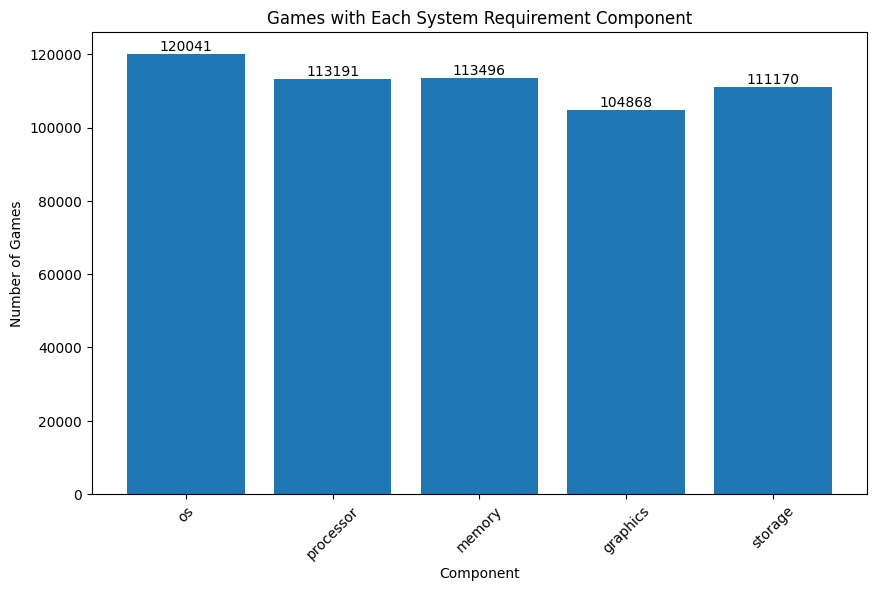

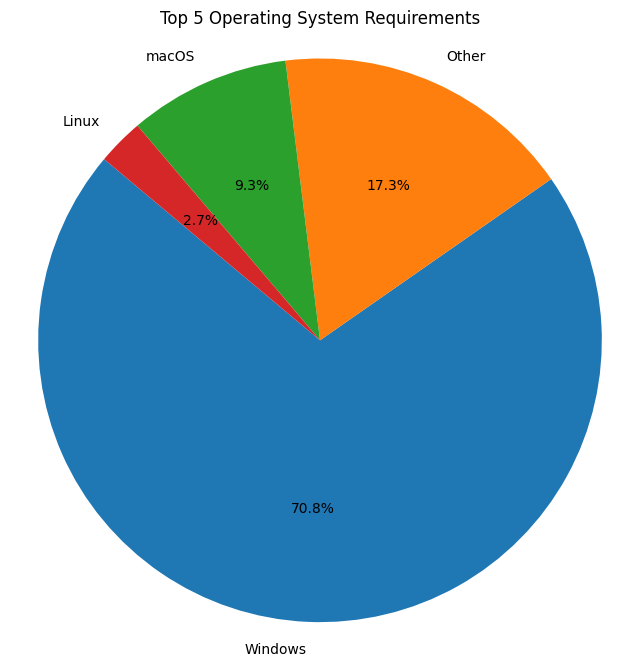

In [49]:
# Visualize system requirements distribution
import matplotlib.pyplot as plt

# Count games with each type of requirement
component_presence = {}
for component in ['os', 'processor', 'memory', 'graphics', 'storage']:
    count = len(component_counters[component])  # Number of unique values, but actually we want games with that component
    # Since each game can contribute multiple times if it has min/rec, but for presence, we need to count unique games
    # Actually, since we're counting unique values, but for visualization, we want games that have that component
    # Let's count the number of games that have at least one value for that component
    games_with_component = set()
    for game in all_games:
        sysreq = game.get("system_requirements") or {}
        if not isinstance(sysreq, dict):
            continue
        os_variants = ["windows", "mac", "linux"]
        for os_name in os_variants:
            os_data = sysreq.get(os_name)
            if not os_data or not isinstance(os_data, dict):
                continue
            for level in ["minimum", "recommended"]:
                level_data = os_data.get(level)
                if not level_data or not isinstance(level_data, dict):
                    continue
                if level_data.get(component):
                    games_with_component.add(game.get('title', str(id(game))))
                    break
    component_presence[component] = len(games_with_component)

plt.figure(figsize=(10, 6))
components = list(component_presence.keys())
counts = list(component_presence.values())
bars = plt.bar(components, counts)
plt.title('Games with Each System Requirement Component')
plt.xlabel('Component')
plt.ylabel('Number of Games')
plt.xticks(rotation=45)

# Add value labels on bars
for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5, str(count), ha='center', va='bottom')

plt.show()

# Pie chart for OS distribution
if os_counter:
    plt.figure(figsize=(8, 8))
    labels = [os_name for os_name, _ in os_counter.most_common(5)]
    sizes = [count for _, count in os_counter.most_common(5)]
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.title('Top 5 Operating System Requirements')
    plt.axis('equal')
    plt.show()

In [50]:
# CPU Analysis
print("=== CPU REQUIREMENTS ANALYSIS ===")

cpu_families = Counter()
cpu_speeds = []
cpu_generations = []

for val in component_counters['processor'].keys():
    val_lower = val.lower()
    count = component_counters['processor'][val]

    # Categorize CPU types
    if 'core i3' in val_lower:
        cpu_families['Intel Core i3'] += count
    elif 'core i5' in val_lower:
        cpu_families['Intel Core i5'] += count
    elif 'core i7' in val_lower:
        cpu_families['Intel Core i7'] += count
    elif 'core i9' in val_lower:
        cpu_families['Intel Core i9'] += count
    elif 'ryzen 3' in val_lower:
        cpu_families['AMD Ryzen 3'] += count
    elif 'ryzen 5' in val_lower:
        cpu_families['AMD Ryzen 5'] += count
    elif 'ryzen 7' in val_lower:
        cpu_families['AMD Ryzen 7'] += count
    elif 'ryzen 9' in val_lower:
        cpu_families['AMD Ryzen 9'] += count
    elif 'pentium' in val_lower:
        cpu_families['Intel Pentium'] += count
    elif 'celeron' in val_lower:
        cpu_families['Intel Celeron'] += count
    elif 'athlon' in val_lower:
        cpu_families['AMD Athlon'] += count
    elif 'intel' in val_lower:
        cpu_families['Other Intel'] += count
    elif 'amd' in val_lower:
        cpu_families['Other AMD'] += count
    else:
        cpu_families['Other'] += count

    # Extract CPU speeds (GHz) - multiply by count since it's per unique value
    ghz_match = re.search(r'(\d+(?:\.\d+)?)\s*ghz', val_lower)
    if ghz_match:
        speed = float(ghz_match.group(1))
        cpu_speeds.extend([speed] * count)

    # Extract CPU generations (for Intel Core)
    gen_match = re.search(r'core i\d-(\d+)', val_lower)
    if gen_match:
        gen = int(gen_match.group(1))
        cpu_generations.extend([gen] * count)

print("CPU Family Distribution:")
for cpu_type, count in sorted(cpu_families.items(), key=lambda x: x[1], reverse=True):
    if count > 0:
        print(f"  {cpu_type}: {count} games")

if cpu_speeds:
    print("\nCPU Speed Statistics:")
    print(f"  Average Speed: {sum(cpu_speeds)/len(cpu_speeds):.1f} GHz")
    print(f"  Median Speed: {sorted(cpu_speeds)[len(cpu_speeds)//2]:.1f} GHz")
    print(f"  Min Speed: {min(cpu_speeds):.1f} GHz")
    print(f"  Max Speed: {max(cpu_speeds):.1f} GHz")

if cpu_generations:
    print("\nIntel Core CPU Generations:")
    gen_counter = Counter(cpu_generations)
    for gen, count in sorted(gen_counter.items()):
        print(f"  {gen}th Gen: {count} games")

=== CPU REQUIREMENTS ANALYSIS ===
CPU Family Distribution:
  Other: 100652 games
  Other Intel: 67950 games
  Intel Core i5: 36687 games
  Intel Core i3: 25030 games
  Intel Core i7: 12057 games
  Intel Pentium: 9257 games
  AMD Ryzen 5: 4861 games
  AMD Athlon: 3529 games
  Other AMD: 2200 games
  AMD Ryzen 3: 2108 games
  Intel Celeron: 1821 games
  AMD Ryzen 7: 1247 games
  Intel Core i9: 353 games
  AMD Ryzen 9: 149 games

CPU Speed Statistics:
  Average Speed: 76.7 GHz
  Median Speed: 2.0 GHz
  Min Speed: 0.0 GHz
  Max Speed: 7777777.0 GHz

Intel Core CPU Generations:
  1th Gen: 2 games
  2th Gen: 37 games
  3th Gen: 6 games
  4th Gen: 15 games
  5th Gen: 3 games
  6th Gen: 6 games
  7th Gen: 32 games
  8th Gen: 5 games
  9th Gen: 19 games
  10th Gen: 25 games
  11th Gen: 2 games
  12th Gen: 2 games
  23th Gen: 1 games
  45th Gen: 1 games
  53th Gen: 2 games
  85th Gen: 1 games
  86th Gen: 6 games
  106th Gen: 4 games
  241th Gen: 6 games
  330th Gen: 7 games
  350th Gen: 4 games


In [51]:
# GPU Analysis
print("=== GPU REQUIREMENTS ANALYSIS ===")

gpu_families = Counter()
gpu_memory = []

for val in component_counters['graphics'].keys():
    val_lower = val.lower()
    count = component_counters['graphics'][val]

    # Categorize GPU types
    if 'nvidia' in val_lower or 'geforce' in val_lower or 'gtx' in val_lower or 'rtx' in val_lower:
        gpu_families['NVIDIA GeForce'] += count
    elif 'amd' in val_lower or 'radeon' in val_lower or 'rx' in val_lower:
        gpu_families['AMD Radeon'] += count
    elif 'intel' in val_lower and ('hd' in val_lower or 'integrated' in val_lower):
        gpu_families['Intel Integrated'] += count
    elif 'intel' in val_lower:
        gpu_families['Intel'] += count
    else:
        gpu_families['Other'] += count

    # Extract GPU memory (MB/GB)
    mem_match = re.search(r'(\d+(?:\.\d+)?)\s*(mb|gb)', val_lower)
    if mem_match:
        amount = float(mem_match.group(1))
        unit = mem_match.group(2).lower()
        if unit == 'gb':
            amount *= 1024  # Convert to MB
        gpu_memory.extend([amount] * count)

print("GPU Family Distribution:")
for gpu_type, count in sorted(gpu_families.items(), key=lambda x: x[1], reverse=True):
    if count > 0:
        print(f"  {gpu_type}: {count} games")

if gpu_memory:
    print("\nGPU Memory Statistics:")
    print(f"  Average Memory: {sum(gpu_memory)/len(gpu_memory):.0f} MB")
    print(f"  Median Memory: {sorted(gpu_memory)[len(gpu_memory)//2]:.0f} MB")
    print(f"  Min Memory: {min(gpu_memory):.0f} MB")
    print(f"  Max Memory: {max(gpu_memory):.0f} MB")

=== GPU REQUIREMENTS ANALYSIS ===
GPU Family Distribution:
  NVIDIA GeForce: 126707 games
  Other: 85908 games
  Intel Integrated: 14483 games
  AMD Radeon: 7111 games
  Intel: 2255 games

GPU Memory Statistics:
  Average Memory: 2666 MB
  Median Memory: 1024 MB
  Min Memory: 0 MB
  Max Memory: 9216000 MB


=== STORAGE REQUIREMENTS ANALYSIS ===
Storage Type Distribution:
  HDD: 84 games
  SSD: 18 games
  UNSPECIFIED: 264508 games

Storage Space Statistics:
  Average Space: 410901929992.5 GB
  Median Space: 1.0 GB
  Min Space: 0.0 GB
  Max Space: 97656250000000000.0 GB


/var/folders/4g/k7hvlycn4c72hfn9g_v3scmm0000gn/T/ipykernel_69817/666752417.py:52: UserWarning:

Attempt to set non-positive xlim on a log-scaled axis will be ignored.



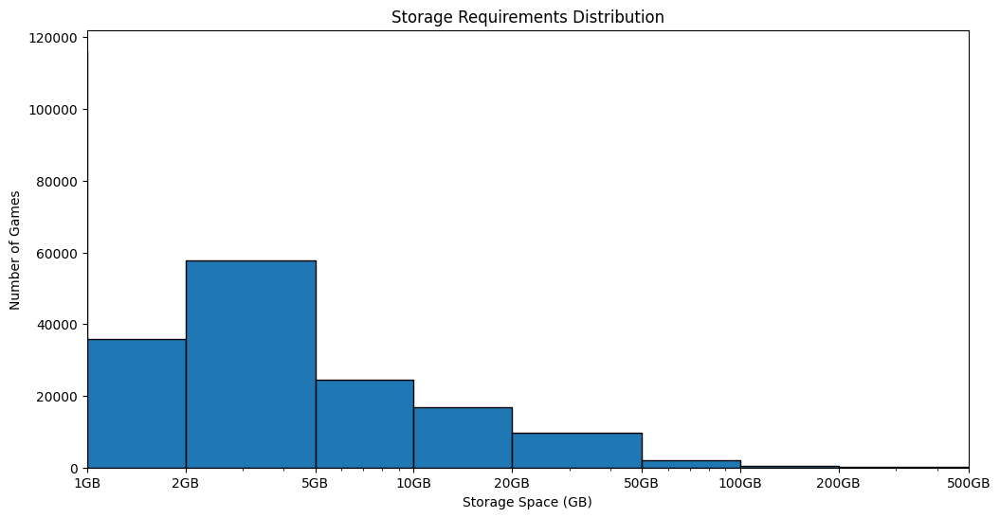


Top Storage Requirements:
  1.0 GB: 30595 games
  2.0 GB: 29783 games
  0.5 GB: 24033 games
  0.2 GB: 19274 games
  4.0 GB: 13716 games
  3.0 GB: 12000 games
  5.0 GB: 10838 games
  0.3 GB: 9223 games
  10.0 GB: 8752 games
  0.1 GB: 8303 games


In [52]:
# Storage Analysis
print("=== STORAGE REQUIREMENTS ANALYSIS ===")

storage_specs = []
storage_types = {'hdd': 0, 'ssd': 0, 'unspecified': 0}

for val in component_counters['storage'].keys():
    val_lower = val.lower()
    count = component_counters['storage'][val]

    # Extract storage amounts
    gb_match = re.search(r'(\d+(?:\.\d+)?)\s*gb', val_lower)
    if gb_match:
        gb_amount = float(gb_match.group(1))
        storage_specs.extend([gb_amount] * count)
    mb_match = re.search(r'(\d+)\s*mb', val_lower)
    if mb_match:
        mb_amount = int(mb_match.group(1))
        gb_amount = mb_amount / 1024
        storage_specs.extend([gb_amount] * count)

    # Categorize storage types
    if 'ssd' in val_lower:
        storage_types['ssd'] += count
    elif 'hdd' in val_lower:
        storage_types['hdd'] += count
    else:
        storage_types['unspecified'] += count

print("Storage Type Distribution:")
for storage_type, count in storage_types.items():
    if count > 0:
        print(f"  {storage_type.upper()}: {count} games")

if storage_specs:
    print("\nStorage Space Statistics:")
    print(f"  Average Space: {sum(storage_specs)/len(storage_specs):.1f} GB")
    print(f"  Median Space: {sorted(storage_specs)[len(storage_specs)//2]:.1f} GB")
    print(f"  Min Space: {min(storage_specs):.1f} GB")
    print(f"  Max Space: {max(storage_specs):.1f} GB")

    # Storage distribution chart
    plt.figure(figsize=(12, 6))
    # Group by reasonable bins
    bins = [0, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000]
    plt.hist(storage_specs, bins=bins, edgecolor='black')
    plt.title('Storage Requirements Distribution')
    plt.xlabel('Storage Space (GB)')
    plt.ylabel('Number of Games')
    plt.xscale('log')
    plt.xticks(bins, [f'{b}GB' for b in bins])
    plt.xlim(0, 500)  # Limit x-axis to prevent outliers from stretching the plot
    plt.show()

# Top storage requirements
storage_counter = Counter(storage_specs)
print("\nTop Storage Requirements:")
for gb, count in sorted(storage_counter.items(), key=lambda x: x[1], reverse=True)[:10]:
    print(f"  {gb:.1f} GB: {count} games")